In [146]:

import pandas as pd

df1 = pd.read_csv("results/program_synthesis/qwen-32b_async_attempt_p1.csv")
df2 = pd.read_csv("results/program_synthesis/qwen-32b_async_attempt_p2.csv")
df3 = pd.read_csv("results/program_synthesis/qwen-32b_async_attempt_p3.csv")
df4 = pd.read_csv("results/program_synthesis/qwen-32b_async_attempt_p4.csv")
df5 = pd.read_csv("results/program_synthesis/qwen-32b_async_attempt_p5.csv")

df_full = pd.concat([df1, df2, df3, df4, df5], axis=0)

df_full.query("average_percentage_correct == 1")["task"].nunique()

df_full.to_csv("results/program_synthesis/qwen2.5-32b_program-synthesis.csv", index=False)

In [144]:
df_full['task'].nunique()

398

In [35]:
import pandas as pd
df = pd.read_csv("results/vl_models/mistral-small_visual-reasoning_p3.csv")
df.query("percentage_correct == 1")['task'].nunique()

24

In [33]:
print(df['llm_full_answer'][0])
df[0:]['task']

<reasoning>
First, let's analyze the image and the integer grids to understand the transformation rule.

**Observations from the Image:**

1. **Grid Size:**
   - The input grids are 5x5.
   - The output grids are 10x10.

2. **Color Patterns:**
   - The output grids seem to be an enlarged version of the input grids.
   - Each cell in the input grid appears to be expanded into a 2x2 block in the output grid.
   - There are additional rows and columns added to the output grid.

**Observations from the Integer Grids:**

1. **Grid Size:**
   - The input grids are 5x5.
   - The output grids are 10x10.

2. **Color Patterns:**
   - Each cell in the input grid is expanded into a 2x2 block in the output grid.
   - The additional rows and columns in the output grid seem to be filled with colors based on the adjacent cells in the input grid.

**Detailed Analysis:**

- **Expansion of Cells:**
  - Each cell in the input grid is expanded into a 2x2 block in the output grid. For example, the top-left 

0      539a4f51
1      810b9b61
2      264363fd
3      dc0a314f
4      7b7f7511
         ...   
204    4290ef0e
205    7e0986d6
206    d13f3404
207    99fa7670
208    b775ac94
Name: task, Length: 209, dtype: object

In [ ]:
df_og = pd.read_csv("results/program_synthesis/qwen2.5-32b_program-synthesis.csv")


solved_tasks = set(df_og.query("average_percentage_correct == 1.0")['task'].to_list())
relevant_tasks = set(df_og.query("average_percentage_correct > 0.1 and average_percentage_correct != 1 and task not in @solved_tasks")["task"].to_list())    

starting_average_score = (
    df_og
    .query("task in @relevant_tasks and \
            average_percentage_correct != 1 and \
            (average_percentage_correct > 0.1 or \
            count_perfect_scores > 1)")
    .drop_duplicates(subset=["average_percentage_correct"], keep='first')
    .sort_values(["count_perfect_scores", "average_percentage_correct"], ascending=False)
    .groupby("task")
    .head(3)
    [['average_percentage_correct']]
    .mean()
)

average_percentage_correct    0.623033
dtype: float64

In [ ]:
df_scam = pd.read_csv("results/program_synthesis/qwen2.5-14b_program-synthesis.csv")
df_scam.query("average_percentage_correct == 1")['task'].nunique()
df_scam['task'].nunique()

36

In [175]:
df = pd.read_csv("results/program_synthesis/qwen2.5-32b_program-synthesis.csv")
    
solved_tasks = set(df.query("average_percentage_correct == 1.0")['task'].to_list())
relevant_tasks = set(df.query("average_percentage_correct > 0.1 and average_percentage_correct != 1 and task not in @solved_tasks")["task"].to_list())

attempt_fixing = (
    df
    .query("task in @relevant_tasks and \
            average_percentage_correct != 1 and \
            (average_percentage_correct > 0.1 or \
            count_perfect_scores > 1)")
    .drop_duplicates(subset=["average_percentage_correct"], keep='first')
    .sort_values(["count_perfect_scores", "average_percentage_correct"], ascending=False)
    .groupby("task")
    .head(3)
)

attempt_fixing

,task,full_answer,extracted_code,generated_grids,average_percentage_correct,count_perfect_scores,temperature,generation_step,sample_num
9859,6e02f1e3,<reasoning>\nLet's start by analyzing the size...,def transform_grid(grid):\n n = len(grid)\n...,"[[[5, 0, 0], [0, 5, 0], [0, 0, 5]], [[5, 0, 0]...",0.912000,4,0.3,0,6
9879,6e02f1e3,<reasoning>\nLet's start with examining the gr...,def transform_grid(grid):\n n = len(grid)\n...,"[[[5, 5, 5], [0, 5, 0], [0, 0, 0]], [[0, 0, 0]...",0.846000,3,0.9,0,40
6307,d4469b4b,"<reasoning>\nFirst, let's check the size of th...",def transform_grid(grid):\n output = [[0 fo...,"[[[5, 5, 5], [0, 5, 0], [0, 5, 0]], [[5, 5, 5]...",0.667143,3,0.5,0,21
2355,017c7c7b,<reasoning>\nLet's analyze the transformation ...,def transform_grid(grid):\n # Replace all o...,"[[[0, 2, 0], [2, 2, 0], [0, 2, 0], [0, 2, 2], ...",0.976667,2,0.3,0,9
3147,bc1d5164,<reasoning>\nLet's break down the problem step...,def transform_grid(grid):\n rows = len(grid...,"[[[0, 8, 0], [8, 8, 8], [0, 8, 0]], [[2, 2, 2]...",0.934000,2,0.7,0,30
...,...,...,...,...,...,...,...,...,...
3885,a61ba2ce,<reasoning>\nLet's start by analyzing the size...,def transform_grid(grid):\n # Identify the ...,"[[[8, 0, 2, 0], [8, 8, 2, 2], [1, 1, 3, 3], [1...",0.125000,0,0.3,0,9
1241,09629e4f,<reasoning>\nLet's start by examining the firs...,def transform_grid(grid):\n def transform_r...,"[[[2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2], [2, 2, 2,...",0.120000,0,0.5,0,23
72,846bdb03,<reasoning>\nLet's start by determining the in...,def transform_grid(grid):\n input_rows = le...,"[[[2, 2, 0, 1, 0, 0, 0, 0], [0, 2, 0, 1, 1, 1,...",0.115000,0,0.3,0,21
3400,9ecd008a,<reasoning>\nLet's start by analyzing the size...,def transform_grid(grid):\n n = len(grid)\n...,"[[[1, 1, 3], [1, 1, 3], [3, 3, 1]], [[4, 4, 1]...",0.110000,0,0.1,0,1


(1000, 2000)


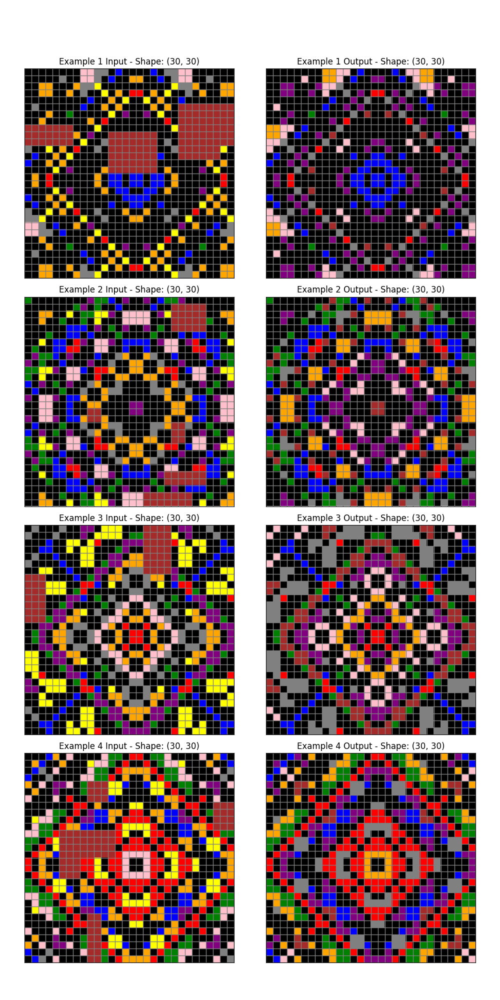

In [37]:
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import numpy as np
from io import BytesIO
from PIL import Image
from typing import Dict, List, Tuple

from utils import load_files_from_json

train, eval = load_files_from_json()

cmap = colors.ListedColormap([
    'black',
    'blue',
    'red',
    'green',
    'yellow',
    'grey',
    'pink',
    'orange',
    'purple',
    'brown'
])

# norm = colors.Normalize(vmin=0, vmax=9)

def visualize_challenges_combined(task: Dict[str, List[Dict[str, List[List[int]]]]]) -> Image.Image:

    num_examples = len(task['train'])

    # Determine the number of rows and columns for the subplot grid
    num_rows = num_examples
    num_cols = 2

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 5 * num_rows))

    for i in range(num_examples):
        mat_inp = np.array(task['train'][i]['input'])
        shape_i = mat_inp.shape
        mat_out = np.array(task['train'][i]['output'])
        shape_o = mat_out.shape

        # Input subplot
        ax_inp = axes[i, 0]  # Access the correct subplot
        ax_inp.imshow(mat_inp, cmap=cmap,)
        ax_inp.set_title(f"Example {i+1} Input - Shape: {shape_i}")
        ax_inp.set_xticks(np.arange(-.5, shape_i[1], 1))
        ax_inp.set_yticks(np.arange(-.5, shape_i[0], 1))
        ax_inp.grid(color='gray', linestyle='-', linewidth=1)
        ax_inp.tick_params(axis='both', which='both', bottom=False, top=False, left=False, right=False, labelbottom=False, labelleft=False)

        # Output subplot
        ax_out = axes[i, 1]  # Access the correct subplot
        ax_out.imshow(mat_out, cmap=cmap, )
        ax_out.set_title(f"Example {i+1} Output - Shape: {shape_o}")
        ax_out.set_xticks(np.arange(-.5, shape_o[1], 1))
        ax_out.set_yticks(np.arange(-.5, shape_o[0], 1))
        ax_out.grid(color='gray', linestyle='-', linewidth=1)
        ax_out.tick_params(axis='both', which='both', bottom=False, top=False, left=False, right=False, labelbottom=False, labelleft=False)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust layout to make room for suptitle
    
    # Save the figure to a BytesIO object
    buf = BytesIO()
    plt.savefig(buf, format='png')
    buf.seek(0)
    plt.close(fig)  # Close the matplotlib figure to free up memory

    # Open the image using PIL
    image = Image.open(buf)
    print(image.size)
    return image
    
visualize_challenges_combined(train['3631a71a']) 


In [ ]:
def get_grid_sizes(task: Dict[str, List[Dict[str, List[List[int]]]]]) -> List[Tuple[Tuple[int, int], Tuple[int, int]]]:
    """
    Extracts the dimensions (height, width) of the input and output grids
    for each training example in an ARC task.

    Args:
        task: A dictionary representing an ARC challenge task.
              It should have a 'train' key containing a list of examples,
              where each example is a dictionary with 'input' and 'output' keys,
              both holding 2D lists (grids) of integers.

    Returns:
        A list of tuples. Each tuple corresponds to a training example and
        contains two tuples: the shape (height, width) of the input grid
        and the shape (height, width) of the output grid.
    """
    grid_sizes: List[Tuple[Tuple[int, int], Tuple[int, int]]] = []
    train_examples = task["train"]

    for example in train_examples:
        input_grid = example["input"]
        output_grid = example["output"]

        input_shape = (len(input_grid), len(input_grid[0]) if input_grid else 0)
        output_shape = (len(output_grid), len(output_grid[0]) if output_grid else 0)

        grid_sizes.append((input_shape, output_shape))

    return grid_sizes

def format_grid_sizes_to_string(grid_sizes: List[Tuple[Tuple[int, int], Tuple[int, int]]]) -> str | None:
    """
    Formats a list of input and output grid sizes into a human-readable string (more concise).
    Condenses the output if all input or all output grid sizes are the same.
    Ensures input size information appears before output size information for each case.
    """
    if not grid_sizes:
        return "No grid sizes provided."

    first_in, first_out = grid_sizes[0]
    all_in_same = all(in_size == first_in for in_size, _ in grid_sizes)
    all_out_same = all(out_size == first_out for _, out_size in grid_sizes)

    parts = ["Grid sizes:\n"]

    # Input size information
    if all_in_same:
        parts.append(f"All input grid sizes are {first_in[0]}x{first_in[1]}")
    if not all_in_same:
        parts.extend([f"Example {i + 1} Input: {in_size[0]}x{in_size[1]}"
                      for i, (in_size, _) in enumerate(grid_sizes)])

    # Output size information
    if all_out_same:
        parts.append(f"All output grid sizes are {first_out[0]}x{first_out[1]}")
    if not all_out_same:
        parts.extend([f"Example {i + 1} Output: {out_size[0]}x{out_size[1]}"
                       for i, (_, out_size) in enumerate(grid_sizes)])

    return "\n".join(parts)

grid_sizes = get_grid_sizes(train['53b68214'])
print(format_grid_sizes_to_string(grid_sizes))

Grid sizes:

Example 1 Input: 6x10
Example 2 Input: 5x10
Example 3 Input: 8x10
All output grid sizes are 10x10


In [55]:

def check_task_symmetries(task: Dict[str, List[Dict[str, List[List[int]]]]]) -> Dict[int, Dict[str, List[str]]]:
    """
    Checks for symmetries in the input and output grids of all training examples
    within an ARC task.

    Args:
        task: A dictionary representing an ARC challenge task.
              It should have a 'train' key containing a list of examples,
              where each example is a dictionary with 'input' and 'output' keys,
              both holding 2D lists (grids) of integers.

    Returns:
        A dictionary where keys are the indices of the training examples (starting from 0).
        Each value is another dictionary with two keys: 'input' and 'output'.
        The values for 'input' and 'output' are lists of strings, where each string
        describes a symmetry found in the respective grid of that example.
    """
    all_symmetries: Dict[int, Dict[str, List[str]]] = {}
    train_examples = task["train"]

    for i, example in enumerate(train_examples):
        input_grid = example["input"]
        output_grid = example["output"]

        input_symmetries = check_grid_symmetries(input_grid)
        output_symmetries = check_grid_symmetries(output_grid)

        all_symmetries[i] = {
            "input": input_symmetries,
            "output": output_symmetries,
        }

    return all_symmetries

def check_grid_symmetries(grid: List[List[int]]) -> List[str]:
    """
    Checks for various symmetries in a given grid.

    Args:
        grid: A 2D list (list of lists) representing the grid of integers.

    Returns:
        A list of strings, where each string describes a symmetry found in the grid.
        The list will be empty if no symmetries are detected.
    """
    np_grid = np.array(grid)
    symmetries = []

    # Horizontal Symmetry
    if np.array_equal(np_grid, np.flipud(np_grid)):
        symmetries.append("Horizontal Symmetry")

    # Vertical Symmetry
    if np.array_equal(np_grid, np.fliplr(np_grid)):
        symmetries.append("Vertical Symmetry")

    # Rotational Symmetry (180 degrees)
    if np.array_equal(np_grid, np.rot90(np_grid, k=2)):
        symmetries.append("180-degree Rotational Symmetry")

    # Rotational Symmetry (90 degrees clockwise)
    if np.array_equal(np_grid, np.rot90(np_grid, k=1)):
        symmetries.append("90-degree Clockwise Rotational Symmetry")

    # Rotational Symmetry (90 degrees counter-clockwise, or 270 clockwise)
    if np.array_equal(np_grid, np.rot90(np_grid, k=3)):
        symmetries.append("90-degree Counter-Clockwise Rotational Symmetry")

    # Diagonal Symmetry (top-left to bottom-right)
    if np_grid.shape[0] == np_grid.shape[1] and np.array_equal(np_grid, np_grid.T):
        symmetries.append("Diagonal Symmetry (Top-Left to Bottom-Right)")

    # Anti-Diagonal Symmetry (top-right to bottom-left)
    if np_grid.shape[0] == np_grid.shape[1] and np.array_equal(np_grid, np.fliplr(np_grid).T):
        symmetries.append("Anti-Diagonal Symmetry (Top-Right to Bottom-Left)")

    return symmetries

def format_task_symmetries_to_string(all_symmetries: Dict[int, Dict[str, List[str]]]) -> str:
    """
    Formats the symmetry information for all training examples into a string.

    Args:
        all_symmetries: A dictionary where keys are the indices of training examples
                        and values are dictionaries containing 'input' and 'output'
                        keys, each with a list of found symmetries.

    Returns:
        A string describing the symmetries found in the input and output grids
        of each training example.
    """
    found_any_symmetry = False
    for symmetries in all_symmetries.values():
        if symmetries.get('input') or symmetries.get('output'):
            found_any_symmetry = True
            break

    if not found_any_symmetry:
        return "No symmetries were found in any of the examples."

    output_string = "Symmetry Information:\n"
    for example_index, symmetries in all_symmetries.items():
        output_string += f"Example {example_index + 1}:\n"

        input_syms = symmetries.get('input', [])
        if input_syms:
            output_string += f"  Input Grid: {', '.join(input_syms)}\n"
        else:
            output_string += "  Input Grid: No symmetries found.\n"

        output_syms = symmetries.get('output', [])
        if output_syms:
            output_string += f"  Output Grid: {', '.join(output_syms)}\n"
        else:
            output_string += "  Output Grid: No symmetries found.\n"
        output_string += "\n"

    return output_string.strip()

symmetries = check_task_symmetries(train['54d9e175'])
print(format_task_symmetries_to_string(symmetries))




Symmetry Information:
Example 1:
  Input Grid: Horizontal Symmetry, Vertical Symmetry, 180-degree Rotational Symmetry
  Output Grid: Horizontal Symmetry, Vertical Symmetry, 180-degree Rotational Symmetry

Example 2:
  Input Grid: Horizontal Symmetry
  Output Grid: Horizontal Symmetry

Example 3:
  Input Grid: Horizontal Symmetry
  Output Grid: Horizontal Symmetry

Example 4:
  Input Grid: No symmetries found.
  Output Grid: No symmetries found.


In [64]:
def get_change_grid_text(task: Dict[str, List[Dict[str, List[List[int]]]]]) -> List[str]:
    """
    Creates a text-based representation of the changes between input and output grids
    for each training example. Only generates output if all input-output pairs
    have the exact same size. Cells are separated by "|".

    Args:
        task: A dictionary representing an ARC challenge task.
              It should have a 'train' key containing a list of examples,
              where each example is a dictionary with 'input' and 'output' keys,
              both holding 2D lists (grids) of integers.

    Returns:
        A list of strings, where each string represents the change grid for a
        training example. Each cell's change is shown, and cells are separated by "|".
        Returns an empty list if the input-output sizes are inconsistent.
    """
    train_examples = task["train"]
    if not train_examples:
        return ""

    first_in_shape = tuple(len(row) for row in train_examples[0]['input'])
    first_out_shape = tuple(len(row) for row in train_examples[0]['output'])

    if first_in_shape != first_out_shape:
        return ""

    consistent_size = True
    for example in train_examples:
        in_shape = tuple(len(row) for row in example['input'])
        out_shape = tuple(len(row) for row in example['output'])
        if in_shape != first_in_shape or out_shape != first_out_shape:
            consistent_size = False
            break

    if not consistent_size:
        return ""

    output_string = ""
    for i, example in enumerate(train_examples):
        output_string += f"Example {i + 1} Changes:\n"
        input_grid = example['input']
        output_grid = example['output']
        shape_rows = len(input_grid)
        shape_cols = len(input_grid[0]) if shape_rows > 0 else 0
        change_grid_rows = []

        for r in range(shape_rows):
            row_changes = []
            for c in range(shape_cols):
                if input_grid[r][c] == output_grid[r][c]:
                    row_changes.append(" -- ")
                else:
                    row_changes.append(f"{input_grid[r][c]}->{output_grid[r][c]}")
            change_grid_rows.append("|".join(map(str, row_changes)))

        output_string += "\n".join(change_grid_rows) + "\n\n"

    return output_string.strip()

change_grids = get_change_grid_text(train['5521c0d9'])
print(change_grids)

Example 1 Changes:
 -- | -- | -- | -- | -- | -- | -- | -- | -- | -- | -- | -- | -- | -- | -- 
 -- | -- | -- | -- | -- | -- | -- | -- | -- | -- | -- | -- | -- | -- | -- 
 -- | -- | -- | -- | -- | -- | -- | -- | -- | -- | -- | -- | -- | -- | -- 
 -- | -- | -- | -- | -- | -- | -- | -- | -- | -- | -- | -- | -- | -- | -- 
 -- | -- | -- | -- | -- | -- | -- | -- | -- | -- | -- | -- | -- | -- | -- 
 -- | -- | -- | -- | -- | -- | -- | -- | -- | -- | -- | -- | -- | -- | -- 
 -- | -- | -- | -- | -- | -- | -- | -- | -- | -- | -- | -- | -- | -- | -- 
 -- |0->1|0->1| -- | -- | -- | -- | -- | -- |0->4|0->4|0->4|0->4| -- | -- 
 -- |0->1|0->1| -- | -- | -- | -- | -- | -- |0->4|0->4|0->4|0->4| -- | -- 
 -- |0->1|0->1| -- | -- | -- | -- | -- | -- |0->4|0->4|0->4|0->4| -- | -- 
 -- |0->1|0->1| -- | -- | -- | -- | -- | -- |0->4|0->4|0->4|0->4| -- | -- 
 -- |1->0|1->0| -- |0->2|0->2|0->2|0->2| -- |4->0|4->0|4->0|4->0| -- | -- 
 -- |1->0|1->0| -- |0->2|0->2|0->2|0->2| -- |4->0|4->0|4->0|4->0| -- | -- 
 -- |1

In [81]:
def filter_tasks_by_grid_size(train_tasks: Dict[str, Dict[str, List[Dict[str, List[List[int]]]]]]) -> Dict[str, Dict[str, List[Dict[str, List[List[int]]]]]]:
    """
    Filters a dictionary of ARC training tasks to include only those where
    all input and output grids in all examples (under the 'train' key) have
    a total size (rows * cols) less than or equal to 225, and neither
    dimension exceeds 15.

    Args:
        train_tasks: A dictionary where keys are task IDs and values are
                     dictionaries containing 'train' (and potentially 'test')
                     keys, with lists of training/testing examples.

    Returns:
        A new dictionary containing only the tasks that meet the grid size criteria.
    """
    filtered_tasks: Dict[str, Dict[str, List[Dict[str, List[List[int]]]]]] = {}
    for task_id, task_data in train_tasks.items():
        train_examples = task_data.get('train', [])
        if not train_examples:
            continue  # Skip tasks without training examples

        include_task = True
        for example in train_examples:
            input_grid = example.get('input')
            output_grid = example.get('output')

            if not isinstance(input_grid, list) or not input_grid or not isinstance(input_grid[0], list):
                include_task = False
                print(f"Warning: Task {task_id}, example has invalid input grid format. Skipping task.")
                break
            if not isinstance(output_grid, list) or not output_grid or not isinstance(output_grid[0], list):
                include_task = False
                print(f"Warning: Task {task_id}, example has invalid output grid format. Skipping task.")
                break

            input_rows = len(input_grid)
            input_cols = len(input_grid[0]) if input_rows > 0 else 0
            output_rows = len(output_grid)
            output_cols = len(output_grid[0]) if output_rows > 0 else 0

            # if (input_rows > 15 or input_cols > 15 or input_rows * input_cols > 225 or
            #         output_rows > 15 or output_cols > 15 or output_rows * output_cols > 225):
            #     include_task = False
            if (input_rows * input_cols > 225 or output_rows * output_cols > 225):
                include_task = False
                break  # No need to check other examples in this task

        if include_task:
            filtered_tasks[task_id] = task_data
    return filtered_tasks

filtered_train_tasks = filter_tasks_by_grid_size(train)
len(filtered_train_tasks)

filtered_validation_tasks = filter_tasks_by_grid_size(eval)
len(filtered_validation_tasks)

235

In [5]:
import time
import json
import pandas as pd
from prompt_generators import *
from eval import *
from utils import check_dataset, load_files_from_json, filter_tasks_by_grid_size
from llm_utils import generate_llm_response, initialize_client

from image_descriptions import generate_vlm_descriptions, load_vlm_descriptions
from transformation_rules import determine_transformation_rules, load_transformation_rules

from helper_functions import *

In [21]:
config = {
    'vl_model': 'mistral-small-latest',
    'reasoning_model': 'qwen/qwq-32b',
    'coding_model': 'codestral-latest',
    'sampling_temperatures': [0.1, 0.3, 0.5, 0.7, 0.9],
    'samples_per_step': 10,
    'code_correction_steps': 3,
    'generate_image_descriptions': False,
    'determine_transformation_rules': True
}

check_dataset()
train, eval = load_files_from_json()
test_set = filter_tasks_by_grid_size(train)
test_set = dict(list(test_set.items())[270:])
print(f"Using test_set of size {len(test_set)}")

#client_mistral = initialize_client('mistral')
#client_alibaba = initialize_client('alibaba')
#print("Client initialized!")

## now generate the image descriptions:
# if config['generate_image_descriptions']:
#     vlm_descriptions = generate_vlm_descriptions(test_set, client=client_mistral, model=config['vl_model'])
# else:
#     vlm_descriptions = load_vlm_descriptions()
    
## now generate the image descriptions:
if config['determine_transformation_rules']:
    transformation_rules = determine_transformation_rules(test_set, "results/final_approach/transformation_rules_full4.json")
else:
    transformation_rules = load_transformation_rules()

ARC data complete.
Using test_set of size 30
Querying reasoning model to determine transformation rule for task 82819916
#1 out of 30
####################
Transformation rule found:
The transformation rule is as follows:  
For each row in the input grid that contains non-zero elements (excluding all-zero rows), the first contiguous non-zero elements (from the left until the first zero) form a base pattern. This pattern is then extended to fill the entire row by mirroring it around the row's center. The result ensures that each such row becomes symmetric around its vertical axis.  

**Steps**:  
1. **Identify the base pattern**: For each non-zero row, take the first sequence of non-zero elements (until the first zero is encountered).  
2. **Mirror the pattern**: Extend the row by mirroring the base pattern around the center of the row. This creates symmetry such that the left and right halves of the row are mirror images.  

**Examples**:  
- **Example 1's Row 4**:  
  - Input pattern: 

In [4]:
transformation_rules = load_transformation_rules("results/final_approach/transformation_rules3.json")
len(transformation_rules)


Loaded Transformation Rules


0

In [22]:
import json

def combine_json_files(file_paths, output_file):
    """
    Loads multiple JSON files, combines their dictionaries, handles duplicate keys
    based on empty transformation rules, replaces empty strings with None, and
    saves the result to a new JSON file.

    Args:
        file_paths (list): A list of paths to the JSON files to combine.
        output_file (str): The path to the new JSON file to save the combined data.
    """
    combined_data = {}

    for file_path in file_paths:
        try:
            with open(file_path, 'r') as f:
                data = json.load(f)
                for key, value in data.items():
                    if key in combined_data:
                        # Handle duplicate key
                        existing_rule = combined_data[key].get('transformation_rule')
                        new_rule = value.get('transformation_rule')

                        existing_empty = existing_rule is None or existing_rule == ""
                        new_empty = new_rule is None or new_rule == ""

                        if new_empty and not existing_empty:
                            continue  # Keep the existing one
                        elif not new_empty and existing_empty:
                            combined_data[key] = value  # Replace with the new one
                        # If neither or both are empty, keep the first one (already in combined_data)
                    else:
                        combined_data[key] = value
        except FileNotFoundError:
            print(f"Error: File not found: {file_path}")
        except json.JSONDecodeError:
            print(f"Error: Could not decode JSON from: {file_path}")

    # Replace empty strings in 'transformation_rule' with None
    for key, value in combined_data.items():
        if 'transformation_rule' in value:
            if value['transformation_rule'] == "":
                combined_data[key]['transformation_rule'] = None

    # Save the combined data to a new JSON file
    try:
        with open(output_file, 'w') as f:
            json.dump(combined_data, f, indent=4)
        print(f"Successfully combined data and saved to: {output_file}")
    except IOError:
        print(f"Error: Could not write to file: {output_file}")
        
file_paths = ["/home/daniel-mueller92/Documents/thesis_data_backup/transformation_rules_full.json",
              "/home/daniel-mueller92/Documents/thesis_data_backup/transformation_rules_full2.json",
              "/home/daniel-mueller92/Documents/thesis_data_backup/transformation_rules_full3.json",
              "/home/daniel-mueller92/Documents/thesis_data_backup/transformation_rules_full4.json"]
combine_json_files(file_paths, "/home/daniel-mueller92/Documents/thesis_data_backup/transformation_rules_combined.json")

Successfully combined data and saved to: /home/daniel-mueller92/Documents/thesis_data_backup/transformation_rules_combined.json


In [23]:
 # Optionally, load and print the combined data to verify
with open('/home/daniel-mueller92/Documents/thesis_data_backup/transformation_rules_combined.json', 'r') as f:
    combined_data = json.load(f)
    print("\nCombined Data (Corrected for String Transformation Rule):")
    print(json.dumps(combined_data, indent=4))


Combined Data (Corrected for String Transformation Rule):
{
    "75b8110e": {
        "transformation_rule": "The transformation rule is as follows: Each cell in the output grid is the maximum value found in the corresponding 2x2 block of the input grid. The input grid is divided into 2x2 blocks, and each block's maximum value is placed in the corresponding position in the 4x4 output grid.\n\n**Step-by-Step Explanation:**\n1. **Divide the Input Grid:** Split the 8x8 input grid into non-overlapping 2x2 blocks. This results in a 4x4 grid of blocks.\n2. **Compute Maximum Value:** For each 2x2 block, determine the maximum value present among its four elements.\n3. **Construct Output Grid:** Place the computed maximum value of each block into the corresponding position in the 4x4 output grid.\n\n**Example Validation:**\n- **Example 1's First Block:** The top-left 2x2 block of the input has all 4s, so the output's first cell is 4.\n- **Example 2's First Block:** The first block (columns 0-1

In [60]:
import asyncio
from llm_utils import generate_llm_response_async

check_dataset()
train, eval = load_files_from_json()
test_set = filter_tasks_by_grid_size(train)
#test_set = dict(list(test_set.items())[258:])

transformation_rules = load_transformation_rules("/home/daniel-mueller92/Documents/thesis_data_backup/transformation_rules_combined.json")

config = {
    #'model': 'codestral-latest',
    'model':'qwen/qwen-2.5-coder-32b-instruct',
    'solution_type': 'program_synthesis',
    #'temperatures': [0.1, 0.3, 0.3, 0.5, 0.5, 0.7, 0.7, 0.9, 0.9, 0.9],
    'temperatures': [0.1, 0.3, 0.5, 0.7, 0.9],
    'samples_per_step': 10,
    'code_correction_steps': 4
}

client = initialize_client('openrouter_async')
print("Client initialized!")

print(f"Generated test_set with {len(test_set)} tasks.")

code_results = []

for task_index, (task_name, task_content) in enumerate(test_set.items()):
    print(f"Processing task {task_name} using program synthesis.")
    print(f"This is task #{task_index+1} out of {len(test_set)}.")
    
    if task_name not in df_qwen_coder['task'].values:
    
        messages = generate_coding_prompt(task=task_content)
        
        
    else:
        #print(f"No transformation rule was created for task {task_name} - skipping task.")
        print("Task already processed - skipping...")
        continue
    
    print("Generating code...")
    temperatures = config['temperatures']
    n = config['samples_per_step']
    model = config['model']
    sample_counter = 1
    
    for temp in temperatures:
        print(f"Generating {config['samples_per_step']} solutions using temperature {temp}")
        
        #results = generate_llm_response(client=client, model=model, temperature=temp, messages=messages, num_samples=n)
        
        tasks = [generate_llm_response_async(client=client, model=model, temperature=temp, messages=messages) 
                     for _ in range(n)]
        results = await asyncio.gather(*tasks)
         
        
        ######### Check if good result was found, so we can stop generating programs??
        # Extract code from LLM answers:
        generated_programs = []    
        for result in results:
            extracted_code = extract_code(result)
            generated_programs.append(extracted_code)
            
        print(f"Saved {len(generated_programs)} from output.")
        
        for i, generated_code in enumerate(generated_programs):
            print(f"Attempting to run program #{i}...")
            generated_output_grids = []
            dicts_list = []
            
            # Set up individual input/output examples as arrays
            for example in task_content['train']:
                example_input = example['input']
                example_output = np.array(example['output'])
                # Then execute generated code for each example
                output_grid_with_llm_code = execute_transform_function(generated_code, example_input)
                generated_output_grids.append(output_grid_with_llm_code)
                try:
                    solution_array = np.array(output_grid_with_llm_code)
                except:
                    print("No numpy array could be made :(")
                # compare generated output to actual output
                result = evaluate_solution(solution_array, example_output)
                dicts_list.append(result)
            for d in dicts_list:
                print(d)
    
            # calculate performance indicators for each code generation
            percentage_correct_values = [d['percentage_correct'] for d in dicts_list]
            average_percentage_correct = sum(percentage_correct_values) / len(percentage_correct_values)
            count_perfect_scores = sum(1 for d in dicts_list if d['percentage_correct'] == 1.0)
            print("Code sample: " + str(i), 
                  "Percentage correct: " + str(round(average_percentage_correct, 2)),
                  "Num perfect scores: " + str(round(count_perfect_scores, 2)))
            
            # add to results list          
            row = (
            {
                'task': task_name,
                'sample_num': sample_counter + 50,
                'full_answer': results[i],
                'extracted_code': generated_code,
                'generated_grids': generated_output_grids,
                'average_percentage_correct': average_percentage_correct,
                'count_perfect_scores': count_perfect_scores,
                'temperature': temp,
                'generation_step': 0
            })
            code_results.append(row)
            sample_counter += 1
        
        # save to dataframe and csv  
        df = pd.DataFrame(code_results)
        df.to_csv("results/program_synthesis/qwen-coder_without_transformation_rules9.csv", index=False)
        
        # avoid   
        #time.sleep(5)
            
        ## check if solution found:
        if not (df.query("task == @task_name and average_percentage_correct == 1").empty):
            print("Correct solution found, moving to next task.")
            break
        else:
            print("No correct solution found in this batch.")

ARC data complete.

Loaded Transformation Rules
Client initialized!
Generated test_set with 300 tasks.
Processing task 75b8110e using program synthesis.
This is task #1 out of 300.
Task already processed - skipping...
Processing task 3618c87e using program synthesis.
This is task #2 out of 300.
Task already processed - skipping...
Processing task 3ac3eb23 using program synthesis.
This is task #3 out of 300.
Task already processed - skipping...
Processing task 3c9b0459 using program synthesis.
This is task #4 out of 300.
Task already processed - skipping...
Processing task ba97ae07 using program synthesis.
This is task #5 out of 300.
Task already processed - skipping...
Processing task 846bdb03 using program synthesis.
This is task #6 out of 300.
Task already processed - skipping...
Processing task 10fcaaa3 using program synthesis.
This is task #7 out of 300.
Task already processed - skipping...
Processing task d9f24cd1 using program synthesis.
This is task #8 out of 300.
Task already p

In [39]:
df.query("average_percentage_correct == 1")['task'].unique()

array(['b6afb2da', '49d1d64f', '67385a82', 'a79310a0'], dtype=object)